The S2S Datasets can be found at http://apps.ecmwf.int/datasets/data/s2s/levtype=sfc/type=cf/. The data is mostly available in grib format. The archived datasets are available in the form of control and perturbed forecast. As of now data for control forecast has been downloaded. Given below are the model specifications compiled in tabular form according to our need. 

In [1]:
import numpy as np
import datetime
import scipy as sp
import matplotlib.pyplot as plt
#from mpl_toolkits.basemap import Basemap
import pandas as pd 
import seaborn as sns 
#import cartopy.crs as ccrs
import xarray as xr
#from astropy.table import Table, Column
sns.set_style("whitegrid")
sns.set_context("poster")
from matplotlib import rcParams
from numpy import exp, sin, cos
from cartopy import config
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from wand.image import Image as WImage

In [2]:
df=pd.read_csv('Model Desciption  - Sheet1.csv')
df.dropna(axis=1, how='all')
df.replace(np.nan, '', regex=True)


,MODEL,Time range,Resolution,Levels,Type of levels,Top of model,Ensemble number,Frequency,Coupled (Y/N),First forecast run,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,BoM (ammc),d 0-62,2.5x2.5,17,sigma,10 hPa,33,2/week,Y. ACOM2,22/05/2013,,,,
1,CMA (babj),d 0-60,1x1,40,sigma,0.5 hPa,4,daily,Y. MOM4,01/01/2015,,,,
2,CNR-ISAC (isac),d 0-32,0.75x0.56,54,sigma-hybrid,6.8 hPa,41,weekly,N. Slab ocean,19/10/2015,,,,
3,CNRM (lfpw),d 0-32,0.8x0.8,91,sigma,0.01 hPa,51,weekly,Y. NEMO 3.2,01/04/2015,,,,
4,ECCC (cwao),d 0-32,0.45x0.45,40,sigma-hybrid,2 hPa,21,weekly,N.,02/07/2015,,,,
5,ECMWF (ecmf)**,d 0-46,Tco639/319,91,sigma,0.01 hPa,51,2/week,Y.NEMO 3.4.1,,,,,
6,HMCR (rums),d 0-61,1.1x1.4,28,sigma-hybrid,5 hPa,20,weekly,N.,07/01/2015,,,,
7,JMA (rjtd),d 0-33,Tl479 (0.4x0.4) \n/Tl319 (0.55x0.55),100,sigma-hybrid,0.01 hPa,50,weekly,N.,22/03/2017,,,,
8,KMA (rksl),d 0-60,0.83 x 0.56,85,terrain-following \nhybrid\n height\n coordinates,85 km,4,daily,Y. NEMO 3.4,26/04/2016,,,,
9,NCEP (kwbc),d 0-44,1x1,64,sigma,0.02 hPa,16,daily,Y.MOM4,15/03/2011 *,,,,


Based on the common availability of first forecast run date of 11 models, year 2016 was chosen as 10 models already had their first run by that time.  The parameter -- $\textbf{total precipitation}$ from S2S instantaneous and accumulated dataset was downloaded for the month of June, July, August and September (JJAS), 2016 for the models BOM, ECMWF, KMA, CMA, NCEP, UKMO, METEO-FRANCE, ECCC, HMCR, CNR-ISAC via MARS-python request in grib format and then converted to indivual netcdf files. Spatial resolution for the output files were $1.5\times1.5{^\circ}$ and covered a domain range of 50E--120E and 10S--40N.

For observations, daily averaged data from TRMM for JJAS with spatial resolution of $0.25\times0.25{^\circ}$ for JJAS 2016 was downloaded.

## All compilation of netcdf files, coding and plotting has been carried out with the help of  python. 

# 1. 1-d, 3-d, 5-d, and 9-d forecast. Bias calculation and model comparisons

Out of the ten models mentioned above, 4 models-- CMA, KMA, NCEP, UKMO had daily frequency of runs and hence were chosen for our study. CMA, KMA and UKMO has 6 hourly data for total precipitation (accumulated) with total of 7200 points for June, September, and 7440 points for July and August. On the contrary NCEP has 5280 points for June, September, and 5456 points for July and August. 

Monthly mean precipitation for JJAS 2016 from TRMM has been computed and plotted . June and July shows heavy rainfall on coasts while July shows heavy rainfall over central India. 

![Fig.1](TRMM_monthly_mean.jpg)

The observation results are then compared to 1-day forecast of four models and the observations were $\textbf{extrapolated}$ to coarser grids of the models.

The analysis and comparions so far has been done for the month of July. For generating a monthly mean of 1-day forecast in July, datapoints were considered from 30th June (forecasting for 1st July) to 30th July (forecasting for 31st July).

$\textbf{Corrections :}$ After discussion with Prof. Sahany, certain flaws in 1-day forecast calculations were pointed out and were recomputed using the 48hr-24hr accumulated forecasts from 30th June. 

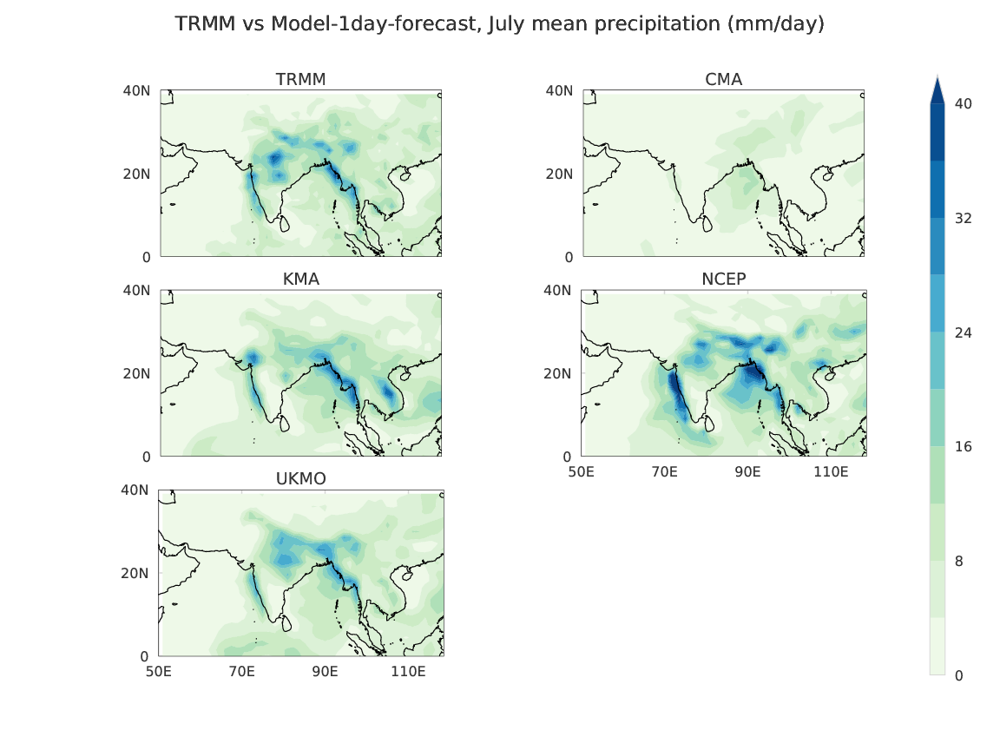

In [3]:
WImage(filename='TRMM_vs_1_day_july.pdf')

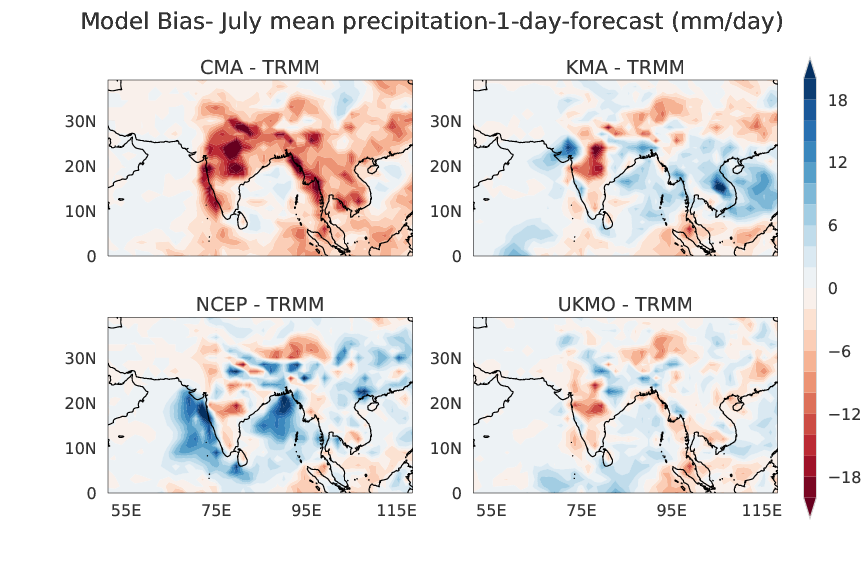

In [4]:
WImage(filename='Model_bias_1_day_july.pdf')

Comparisons of observations with model 1-day forecast show all models except CMA model from  Beijing Climate Center (BCC) Climate Prediction, fairly produce the pattern observed. NCEP and KMA show more precipitation over Western Ghats and Burma Coast. KMA and NCEP show strong wet bias over the coasts and dry bias over central India. UKMO model performs the best in comparison to other models. 

Next, the three day forecasts were made and datapoints were considered from 28th June (forecasting for 1st July) to 28th July (forecasting for 31st July). 

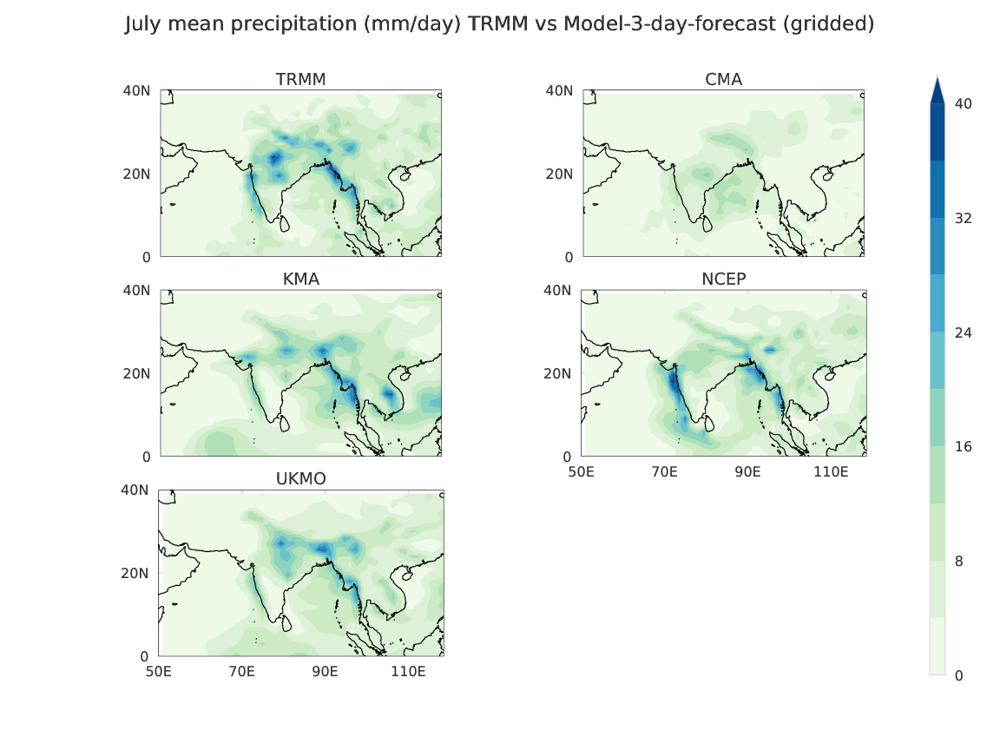

In [5]:
WImage(filename='TRMM_vs_3-day_gridded_jul.pdf')

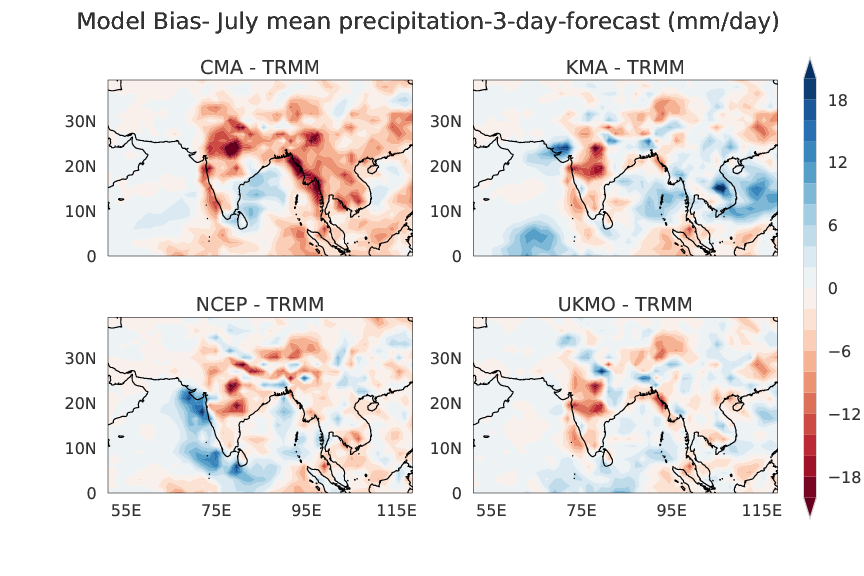

In [6]:
WImage(filename='Model_bias_3day_forecast_jul.pdf')

In 3 day forecasts, UKMO still is ahead of other models. NCEP shows strong wet bias over western ghats and KMA shows dry bias over western ghats and shows a wet bias over Gujarat non-existent in other models. CMA model performs poorly compared to the four other models showing a very strong dry bias over everywhere in Indian subcontinent. 

Five day forecasts were made and datapoints were considered from 26th June (forecasting for 1st July) to 26th July (forecasting for 31st July). 

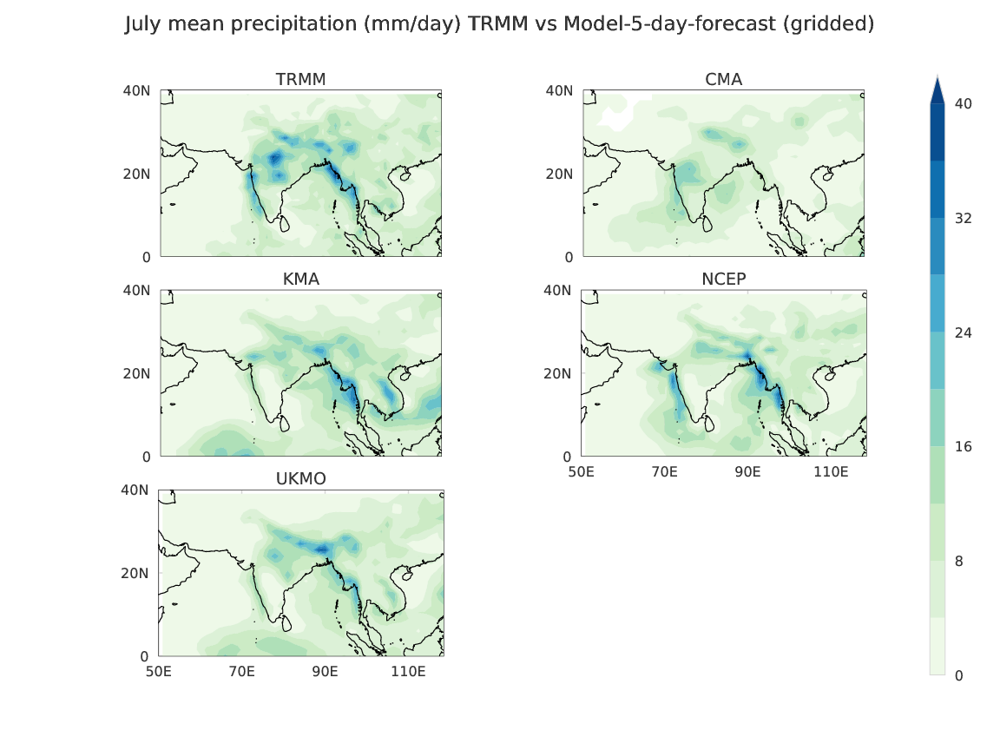

In [7]:
WImage(filename='TRMM_vs_5-day_gridded_july.pdf')

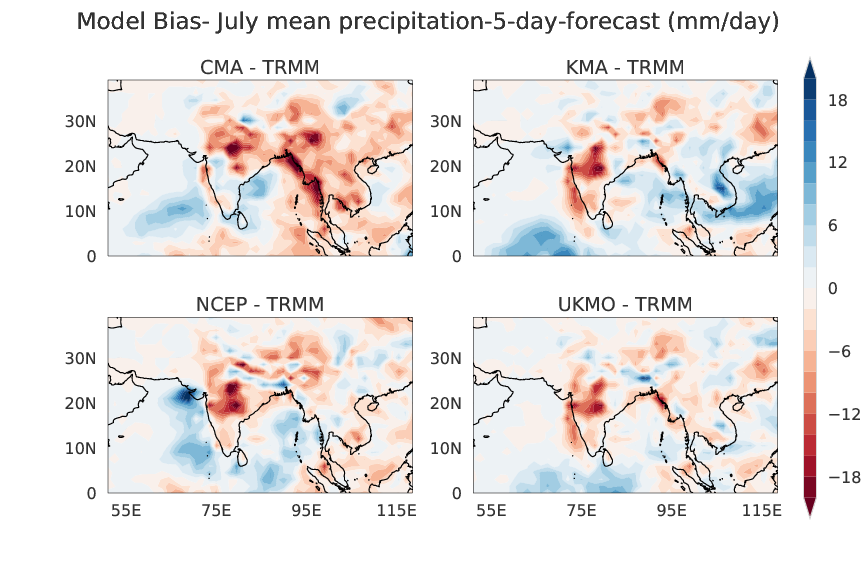

In [8]:
WImage(filename='Model_bias_5day_forecast_july.pdf')

All models except UKMO fail to produce the precipitation properly over land. On the other hand UKMO underestimates precipiation over western Ghats. NCEP now shows a heavy wet bias over Gujarat coast similar to the 3-day forecast map of KMA. 

Nine day forecasts in the medium range were made and datapoints were considered from 22nd June (forecasting for 1st July) to 22nd July (forecasting for 31st July). 

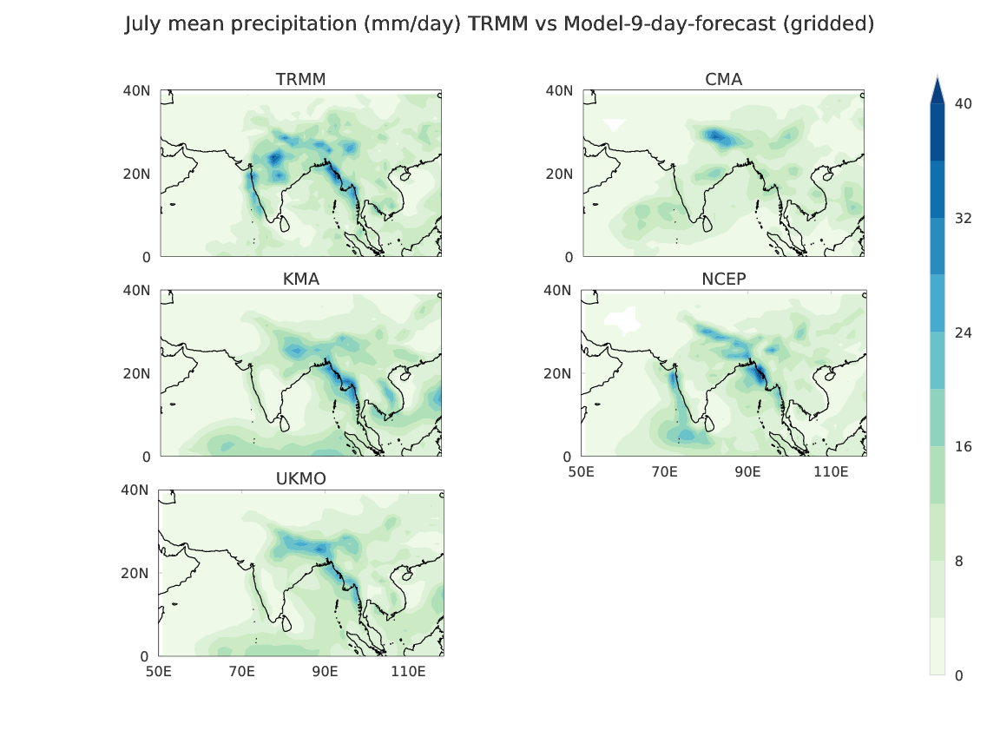

In [9]:
WImage(filename='TRMM_vs_9-day_gridded_july.pdf')

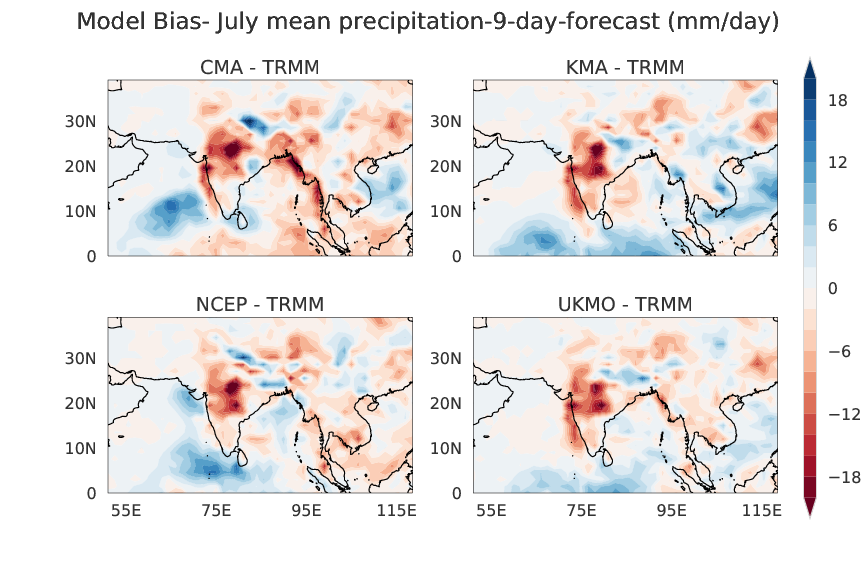

In [10]:
WImage(filename='Model_bias_9day_forecast_july.pdf')

All models show strong dry bias over central India heavily underestimating rainfall magnitude over land but preserving the qualitiative rainfall pattern. 

The UKMO model has the best performance in terms of simulating the results that corroborate with observations. However, it is too early to come to any conclusion in terms of the medium range forecast capabilities of individual models. Similar analysis will be carried out for the month of June, August and September and a general picture for the JJAS will be presented as well. 

Similarly calculations were done for the month of June, August and September involving the 1 day, 3-day, 5-day and 9-day forecast. The results are displayed as follows. 

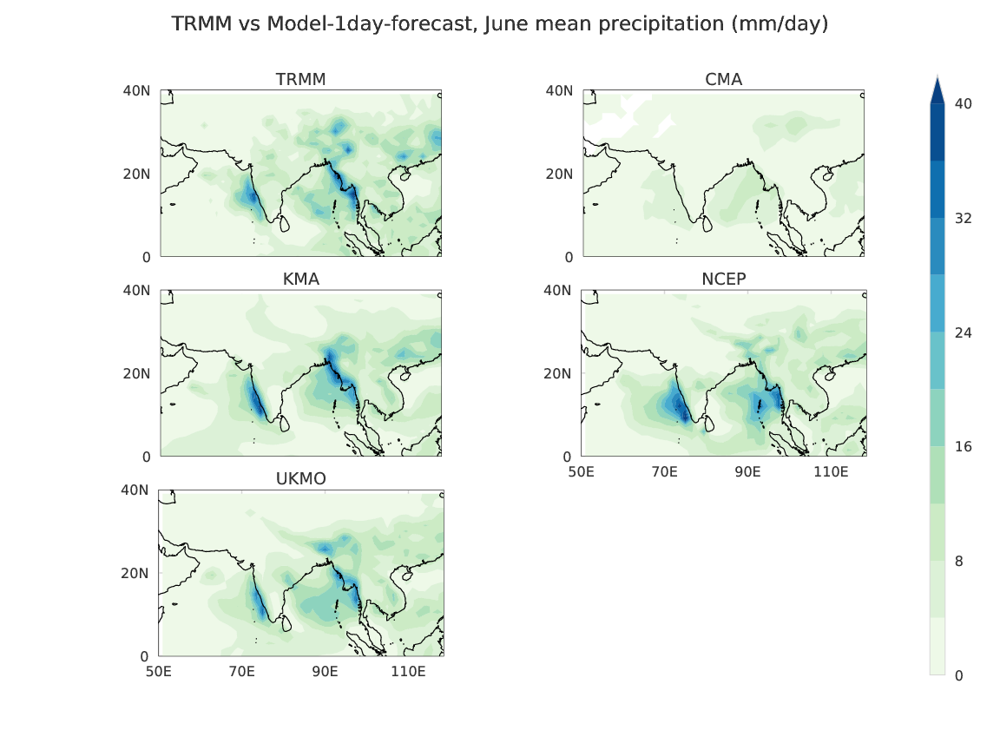

In [11]:
WImage(filename='TRMM_vs_1_day_jun.pdf')

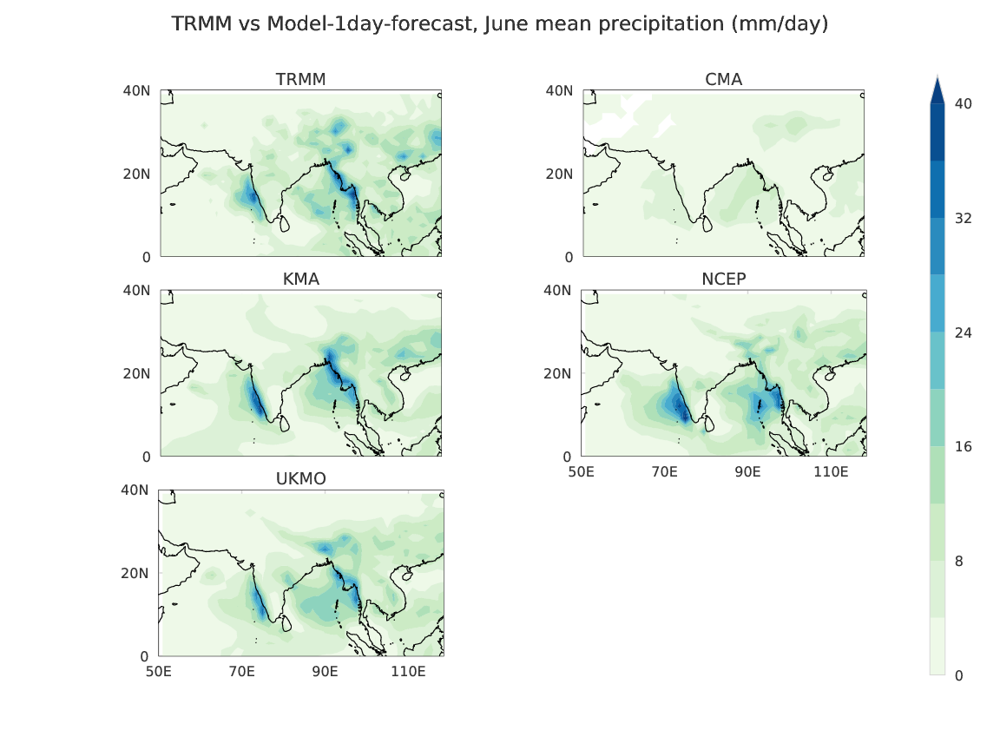

In [12]:
WImage(filename='TRMM_vs_1_day_jun.pdf')

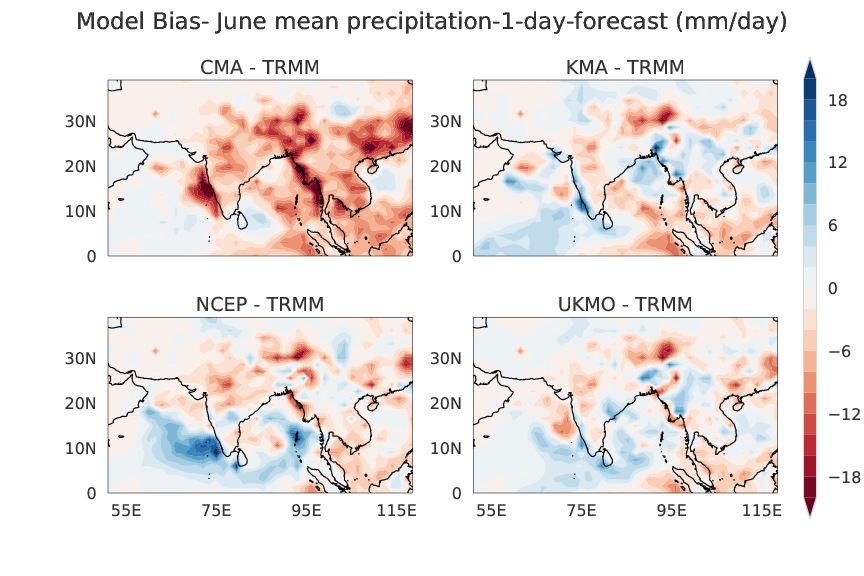

In [13]:
WImage(filename='Model_bias_1_day_jun.pdf')

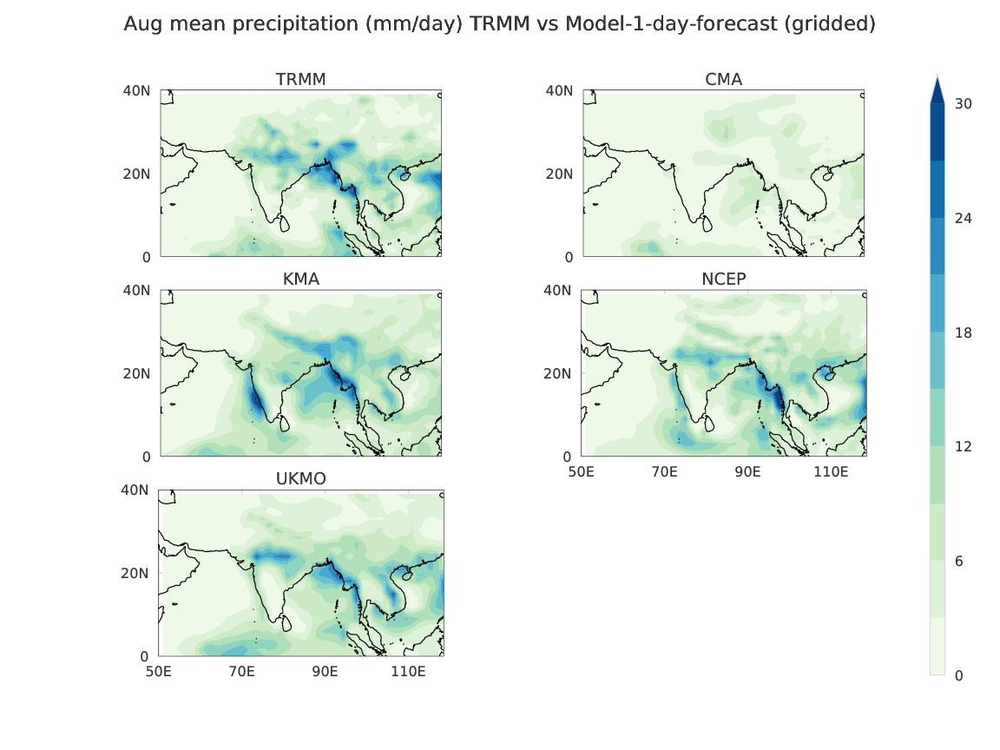

In [14]:
WImage(filename='TRMM_vs_1-day_gridded_aug.pdf')

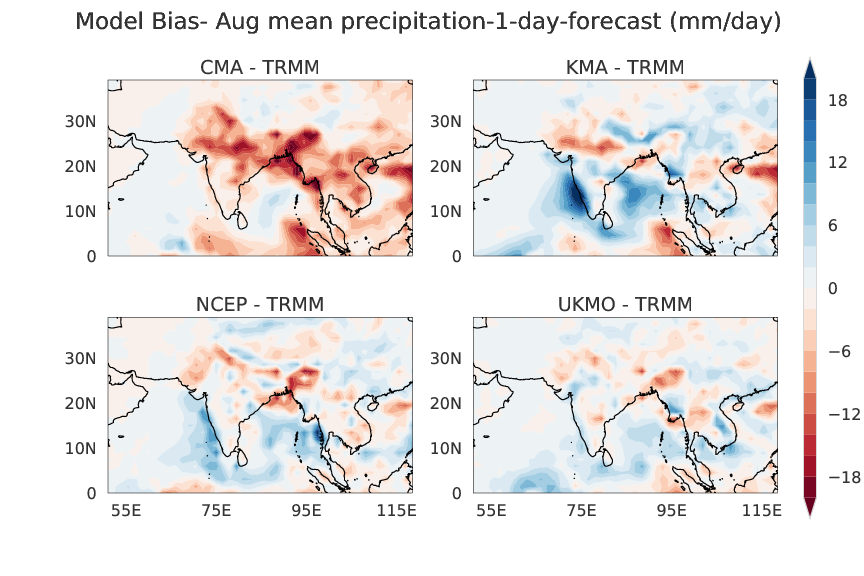

In [15]:
WImage(filename='Model_bias_1day_forecast_aug.pdf')

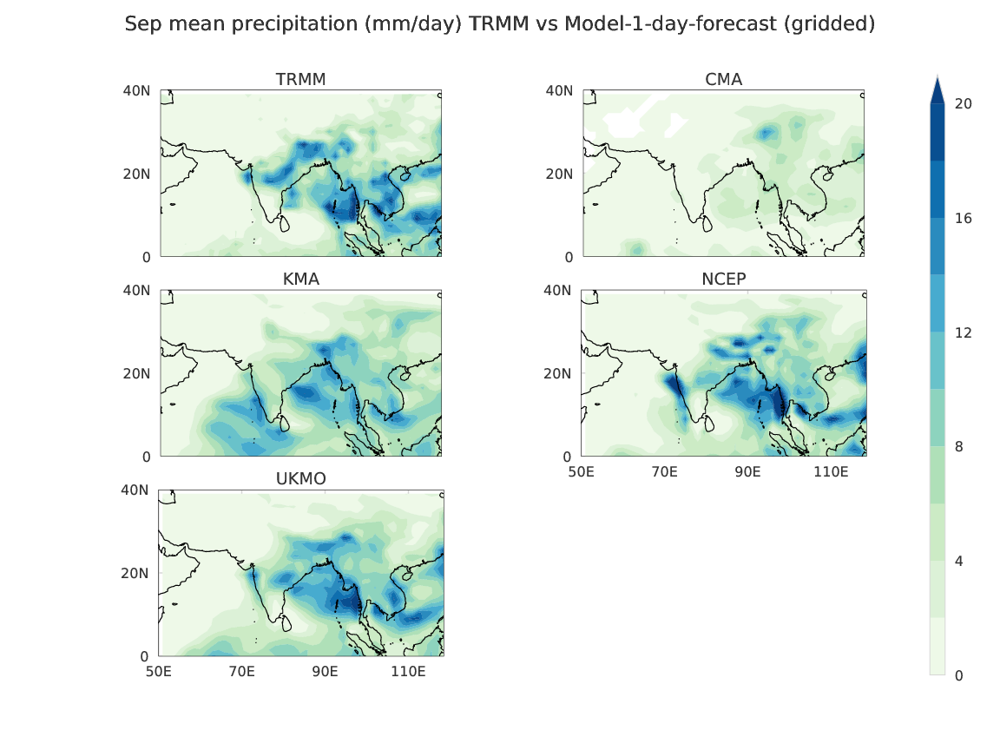

In [16]:
WImage(filename='TRMM_vs_1-day_gridded_sep.pdf')

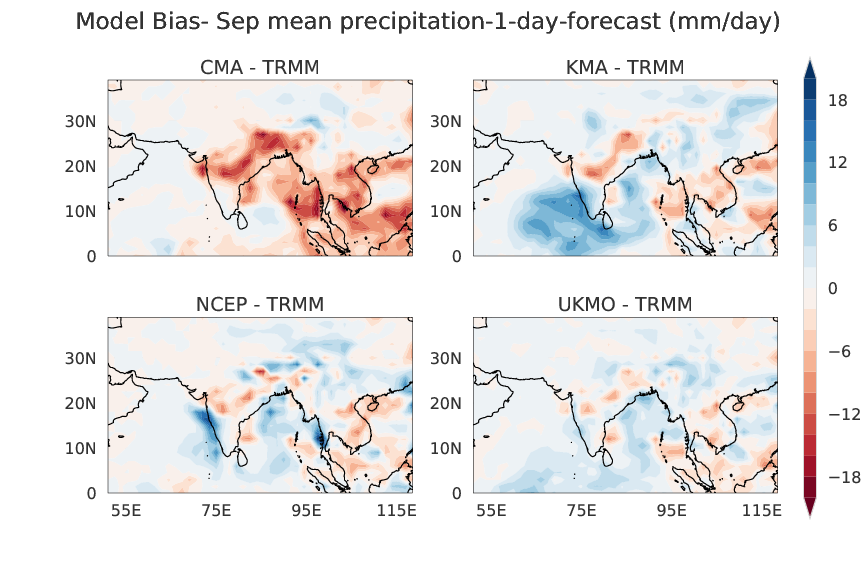

In [17]:
WImage(filename='Model_bias_1day_forecast_sep.pdf')

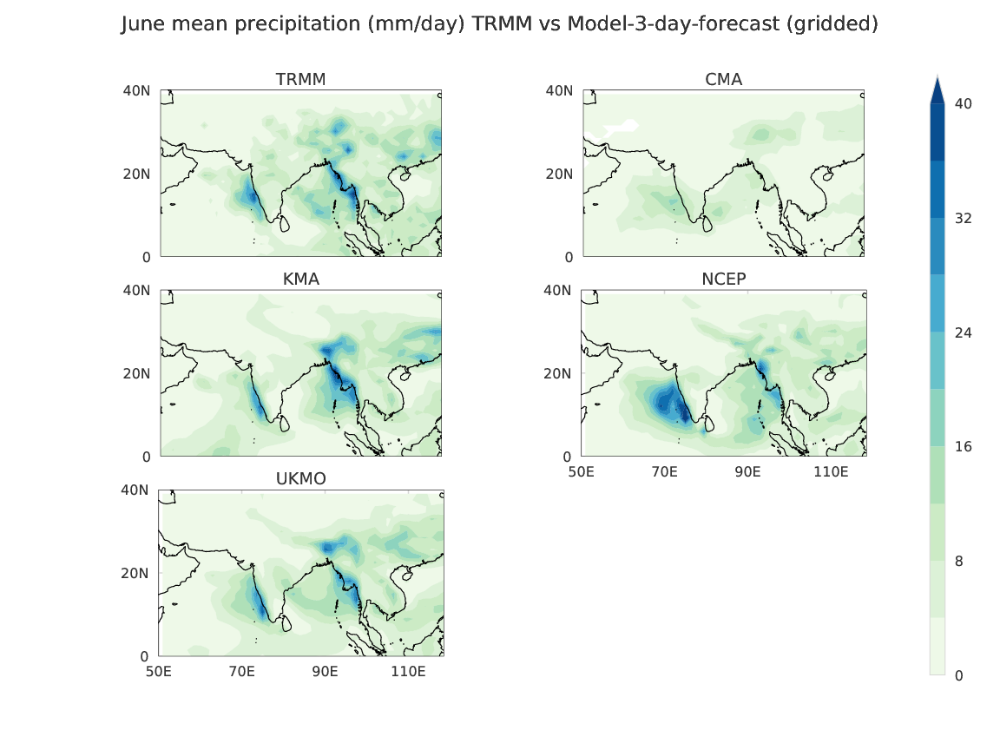

In [18]:
WImage(filename='TRMM_vs_3-day_gridded_jun.pdf')

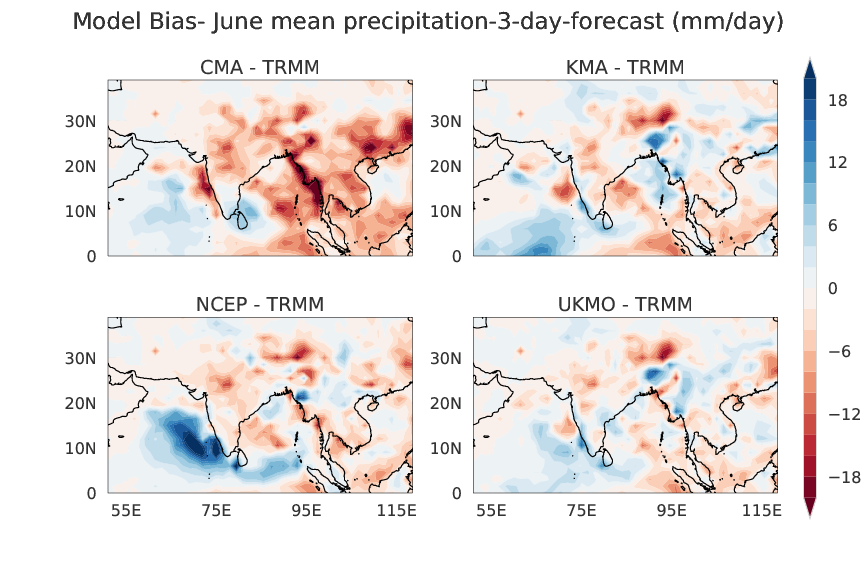

In [19]:
WImage(filename='Model_bias_3day_forecast_jun.pdf')

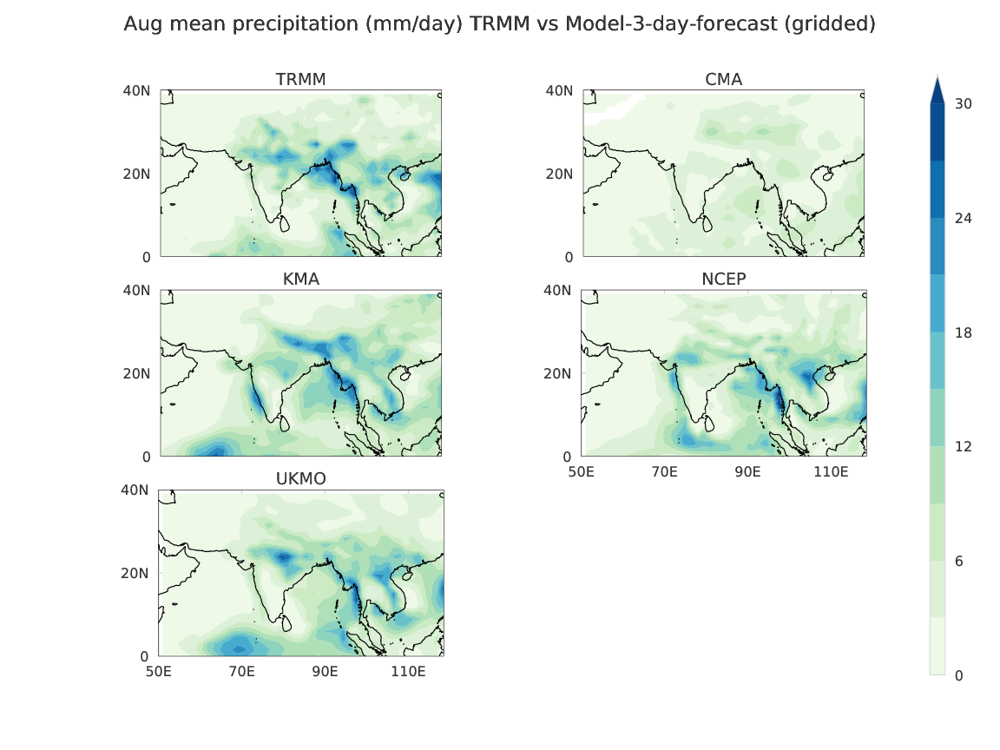

In [20]:
WImage(filename='TRMM_vs_3-day_gridded_aug.pdf')

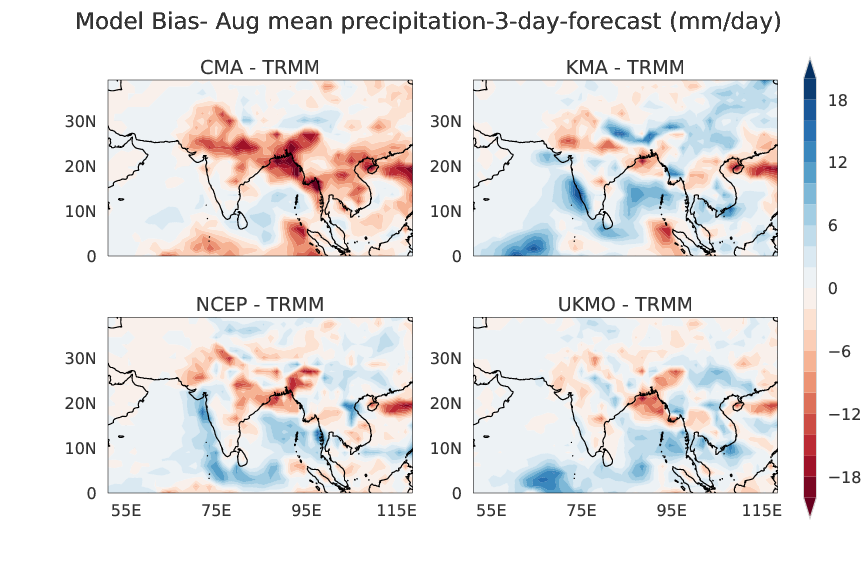

In [21]:
WImage(filename='Model_bias_3day_forecast_aug.pdf')

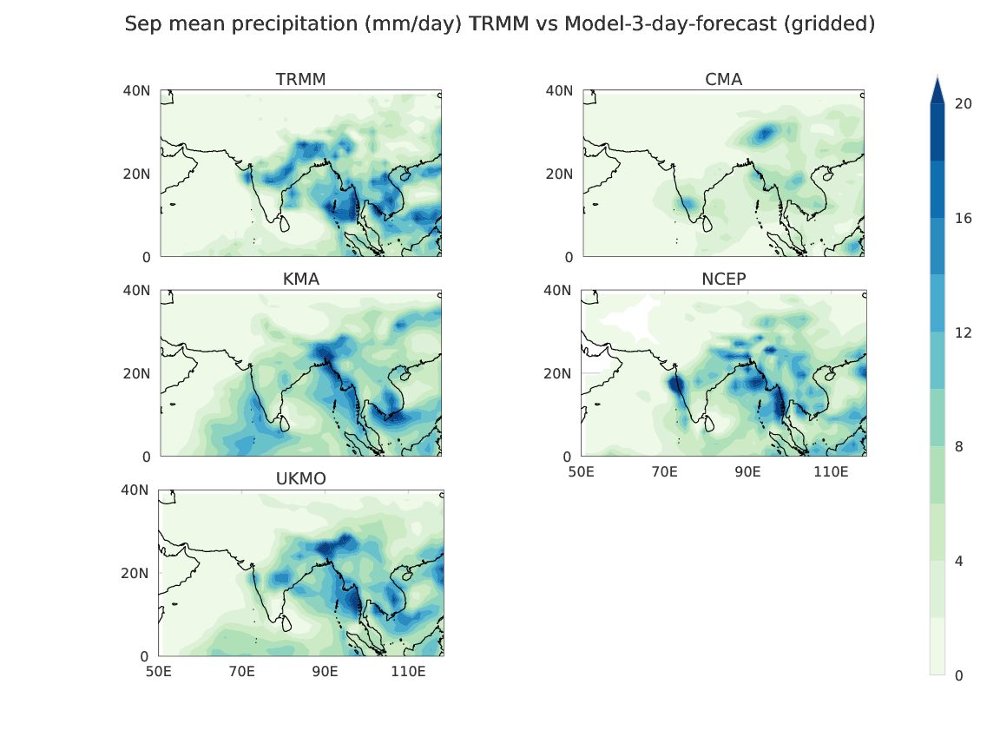

In [22]:
WImage(filename='TRMM_vs_3-day_gridded_sep.pdf')

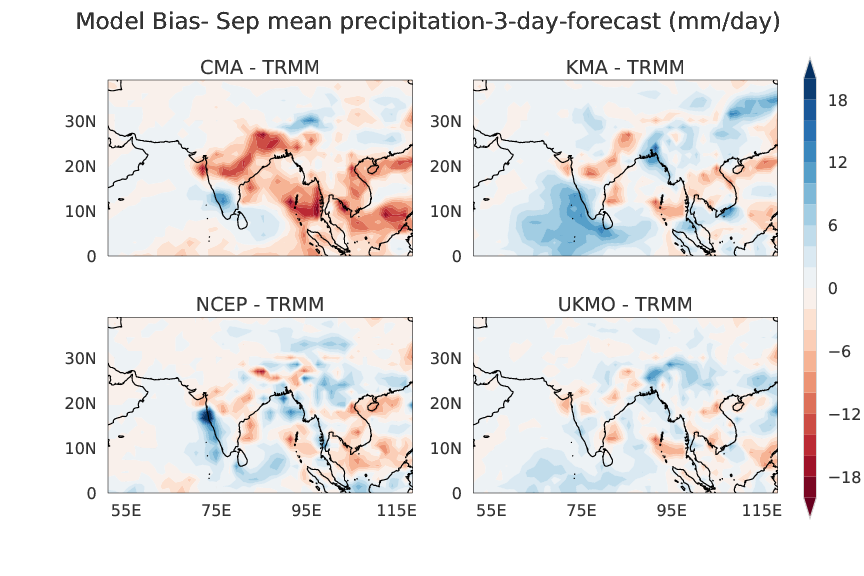

In [23]:
WImage(filename='Model_bias_3day_forecast_sep.pdf')

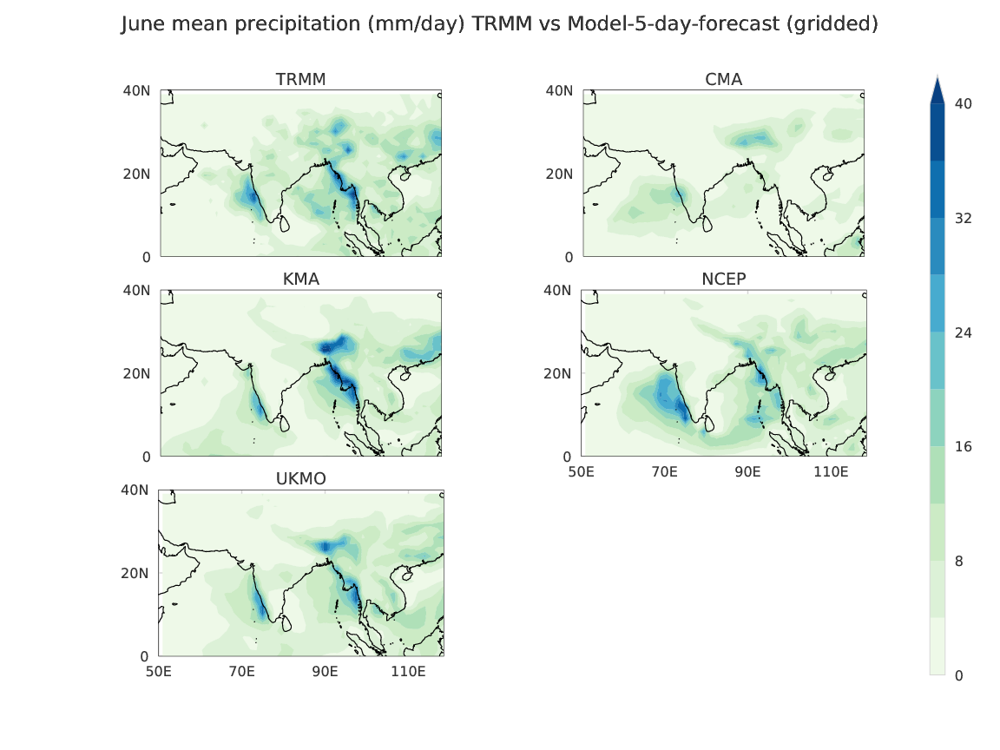

In [24]:
WImage(filename='TRMM_vs_5-day_gridded_jun.pdf')

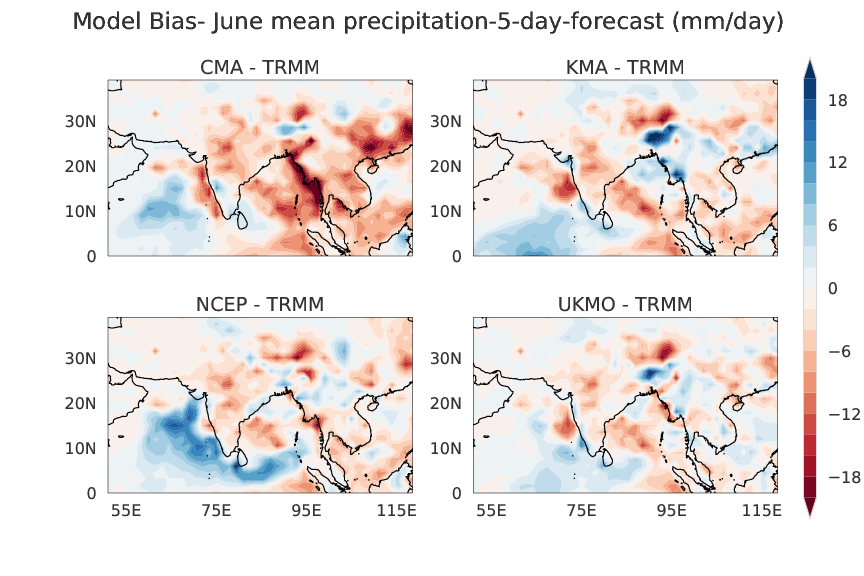

In [25]:
WImage(filename='Model_bias_5day_forecast_jun.pdf')

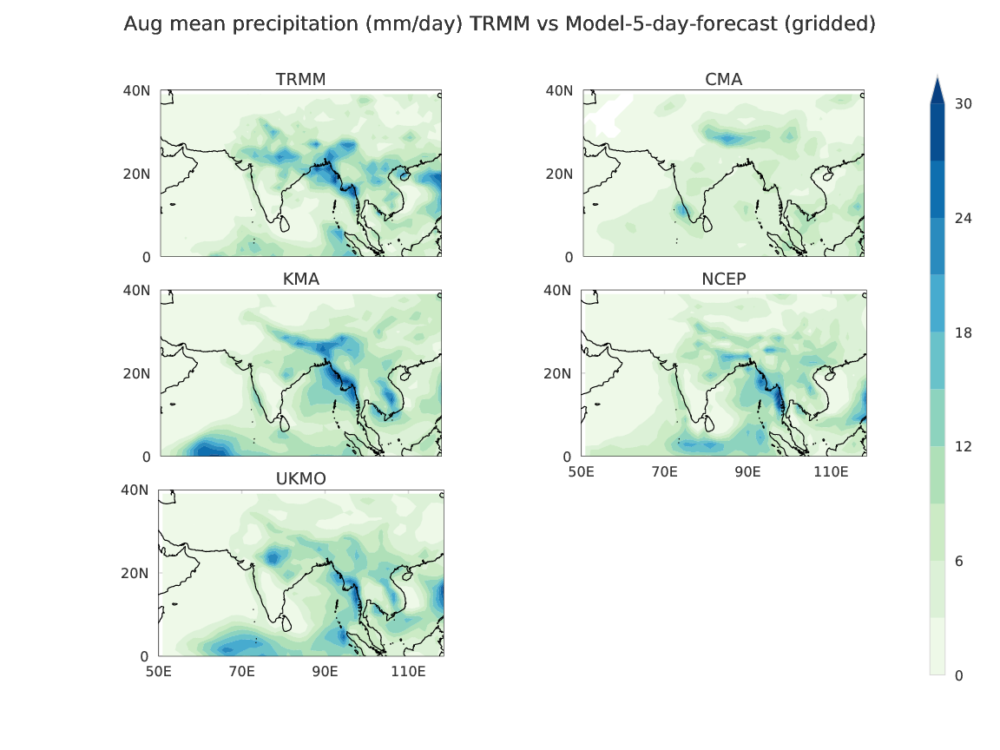

In [26]:
WImage(filename='TRMM_vs_5-day_gridded_aug.pdf')

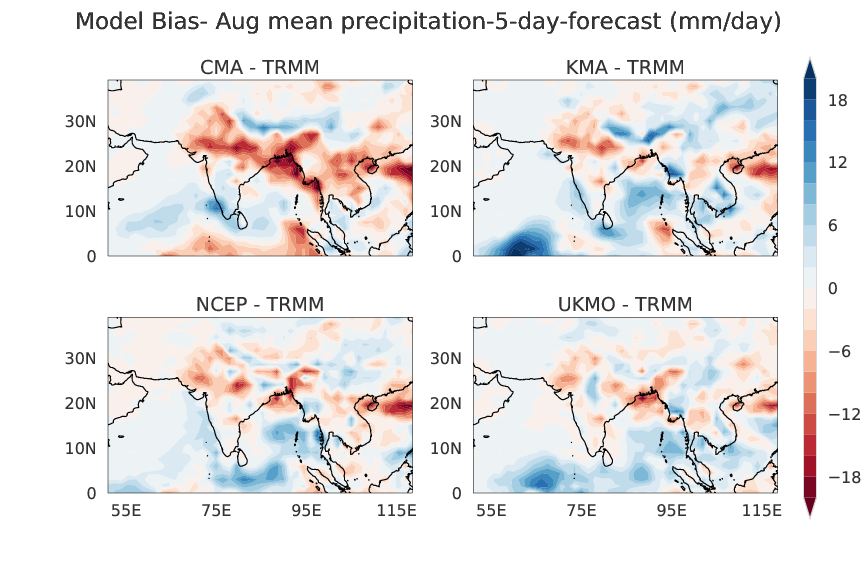

In [27]:
WImage(filename='Model_bias_5day_forecast_aug.pdf')

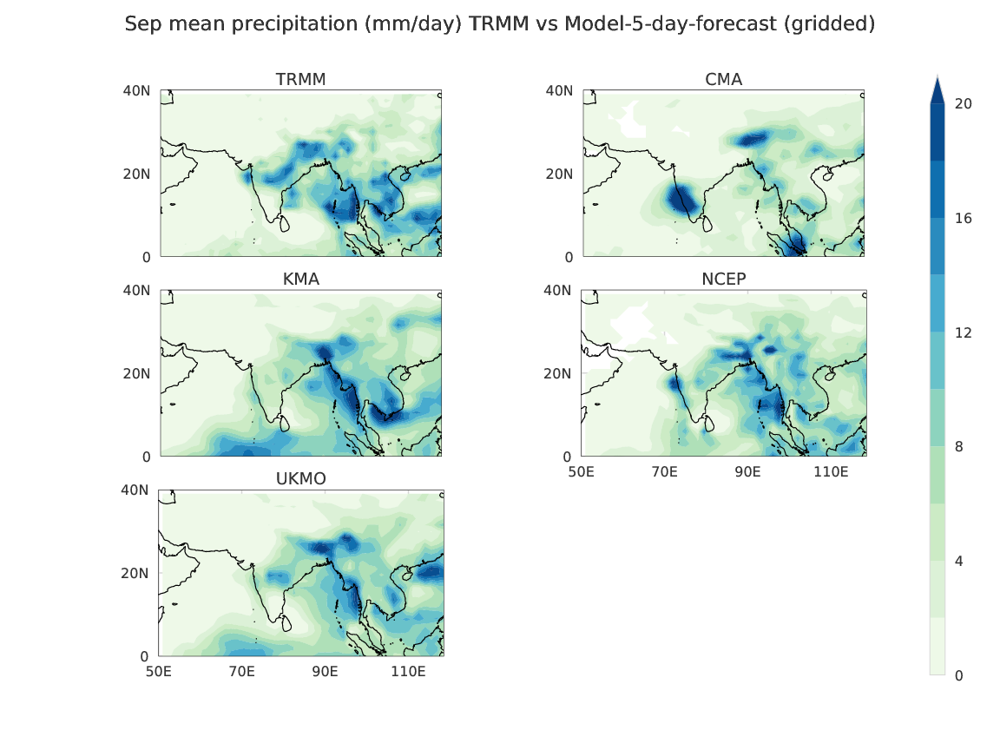

In [28]:
WImage(filename='TRMM_vs_5-day_gridded_sep.pdf')

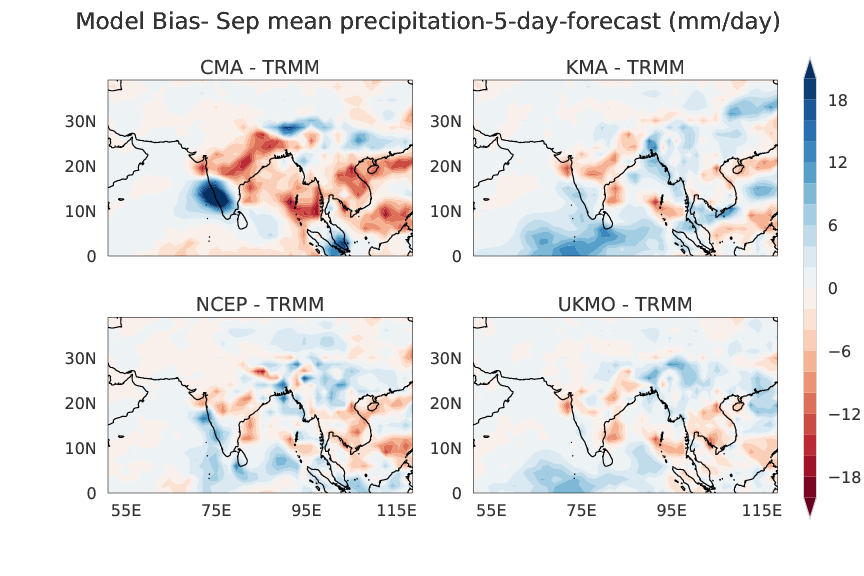

In [29]:
WImage(filename='Model_bias_5day_forecast_sep.pdf')

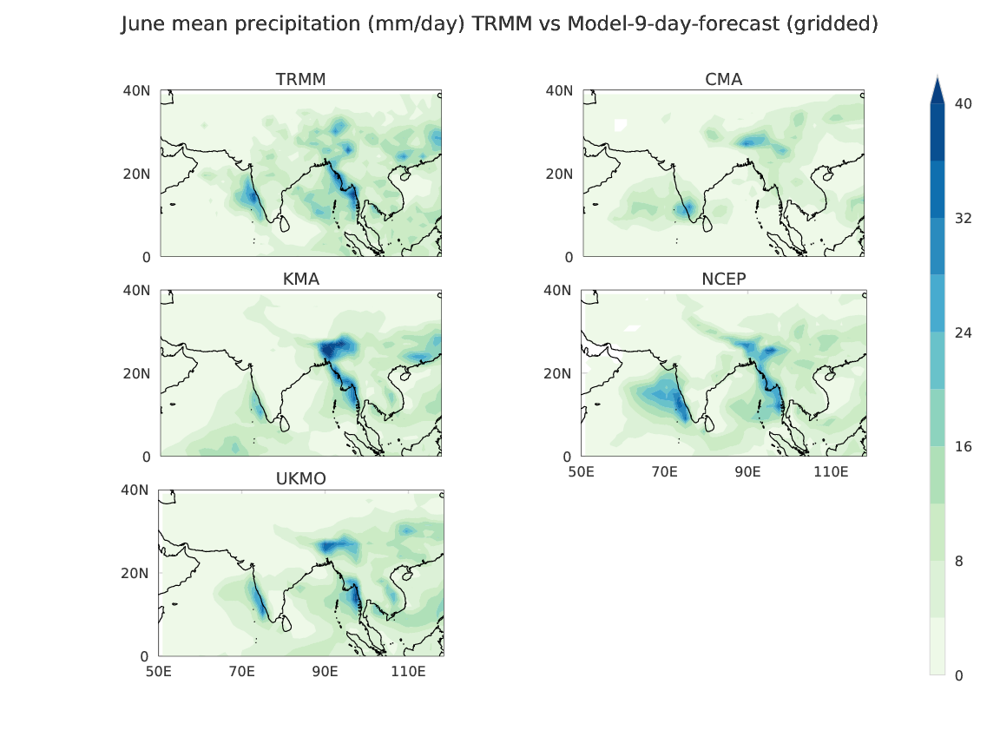

In [30]:
WImage(filename='TRMM_vs_9-day_gridded_jun.pdf')

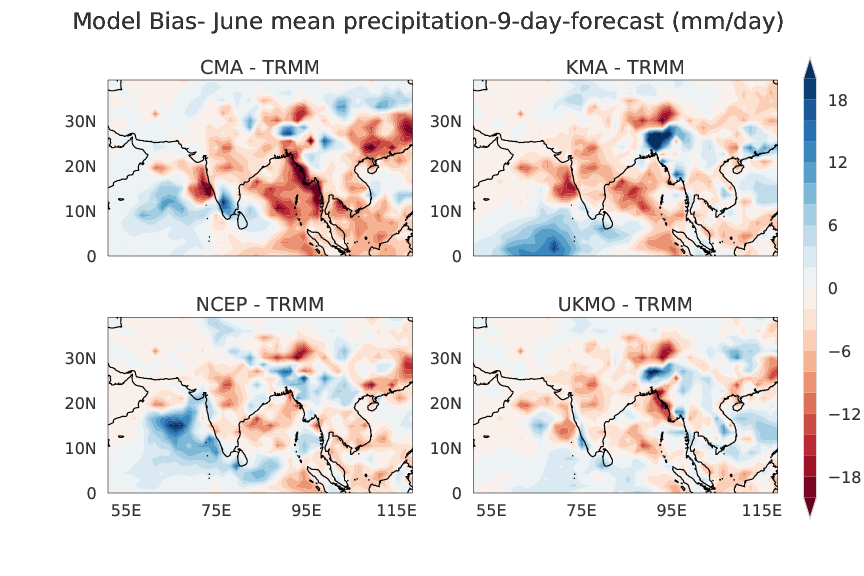

In [31]:
WImage(filename='Model_bias_9day_forecast_jun.pdf')

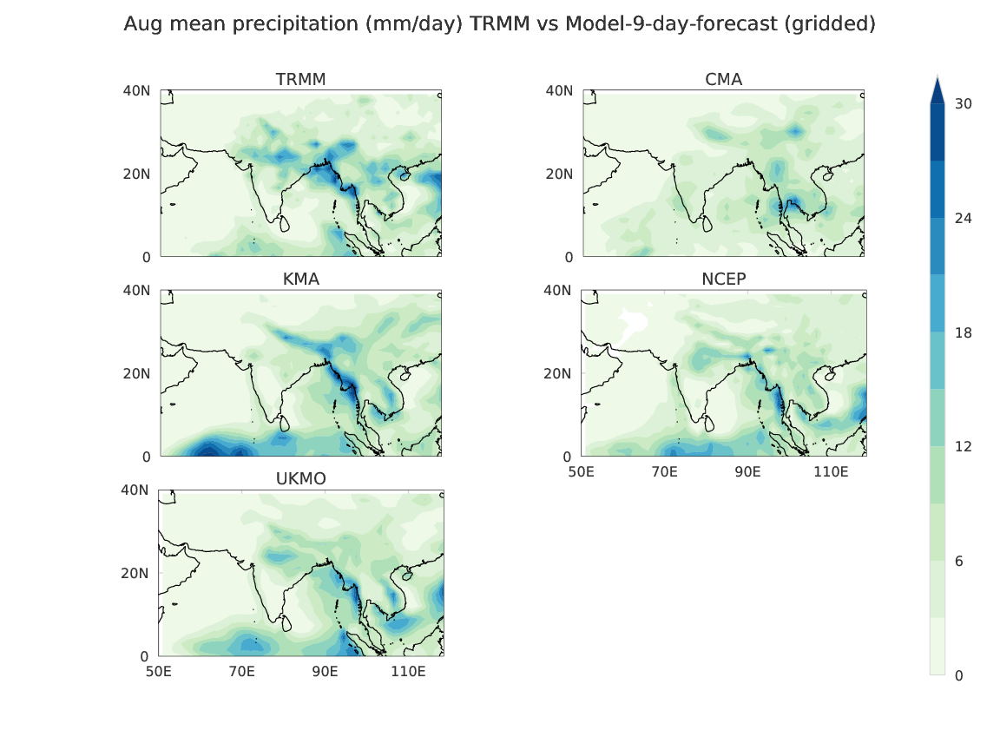

In [32]:
WImage(filename='TRMM_vs_9-day_gridded_aug.pdf')

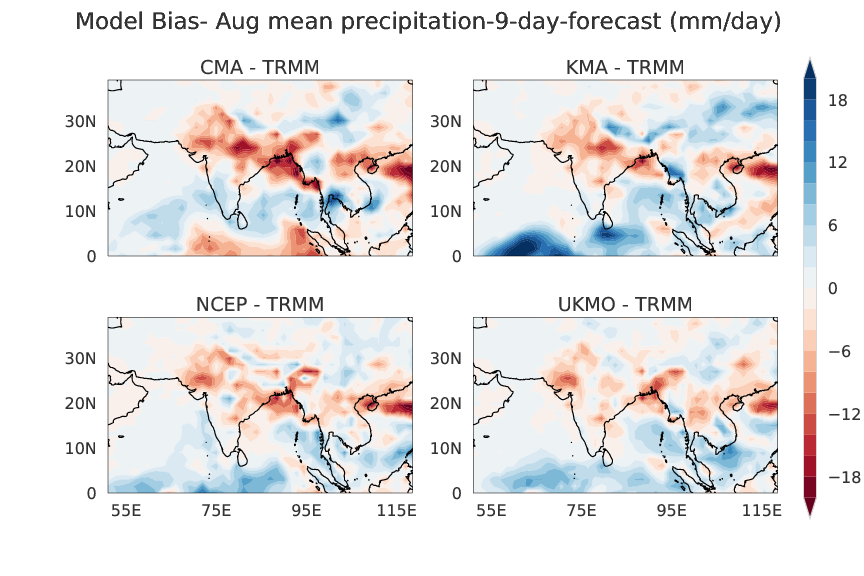

In [33]:
WImage(filename='Model_bias_9day_forecast_aug.pdf')

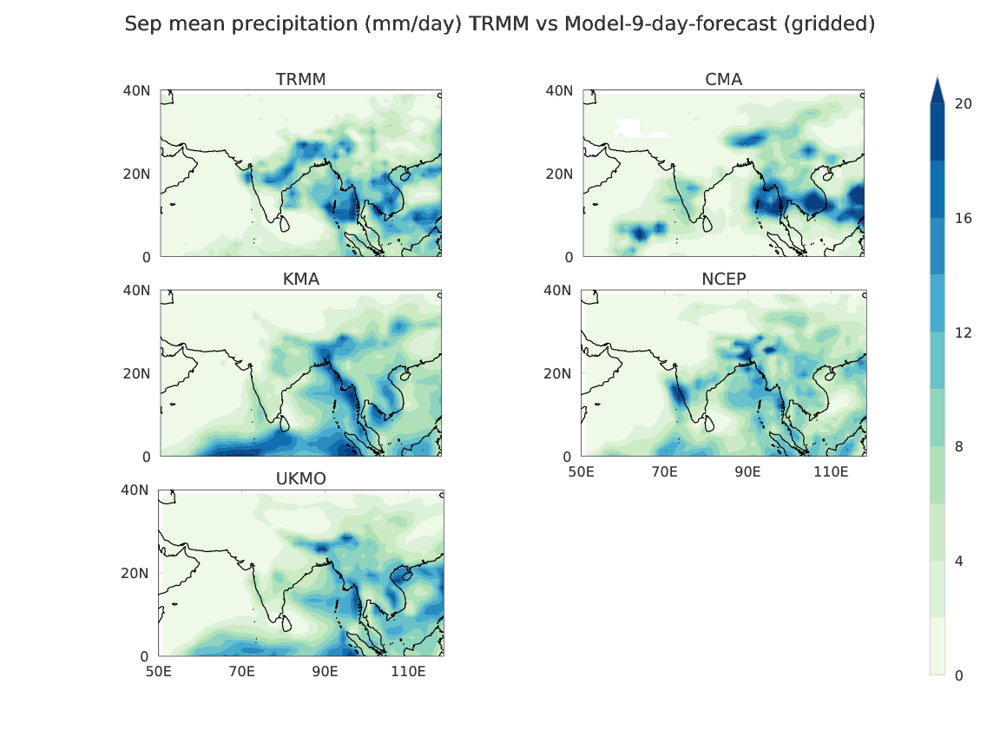

In [35]:
WImage(filename='TRMM_vs_9-day_gridded_sep.pdf')

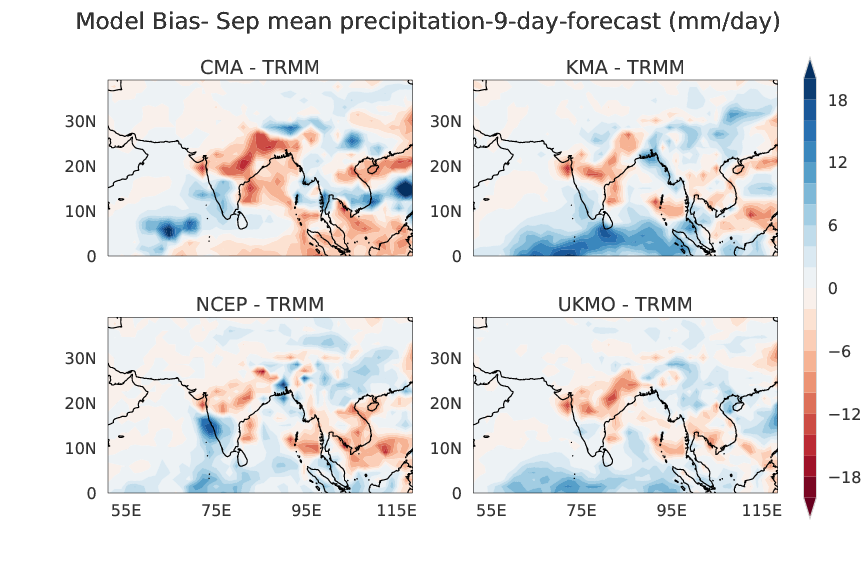

In [36]:
WImage(filename='Model_bias_9day_forecast_sep.pdf')

# Masking

Observations were compared to model simulations over both land and ocean. As a part of the next step, a masking was done for Indian land region and results were compared. The masking was done with the help of Python- gdalwarp using shape file for India.  Sample plots for June is shown here. 

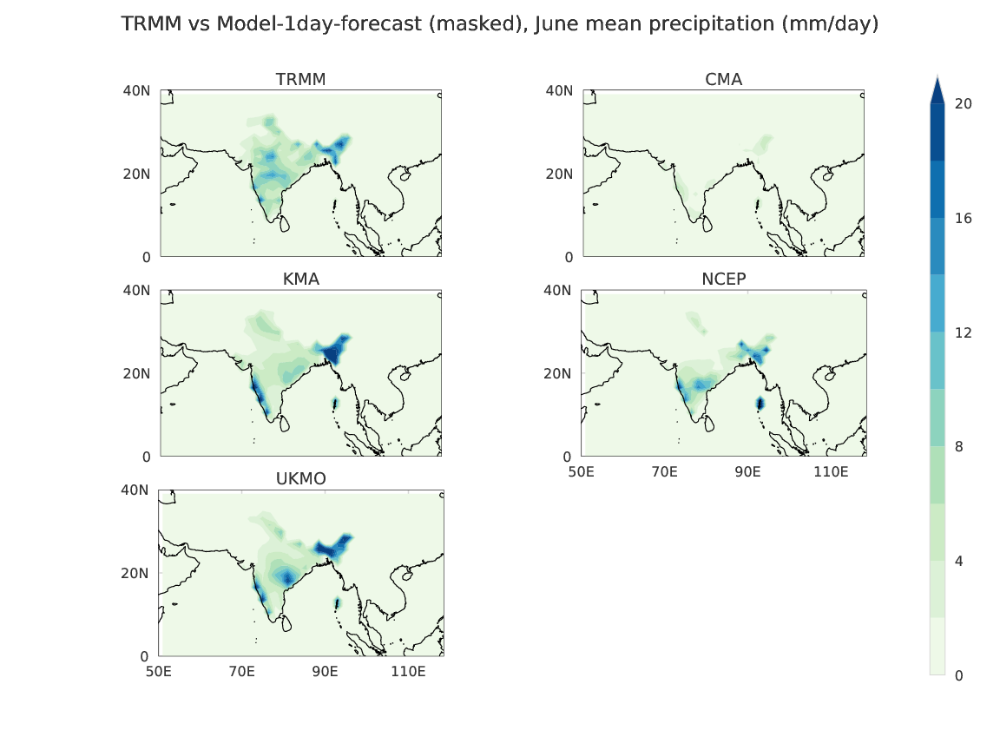

In [40]:
WImage(filename='TRMM_vs_1_day_mask_jun.pdf')

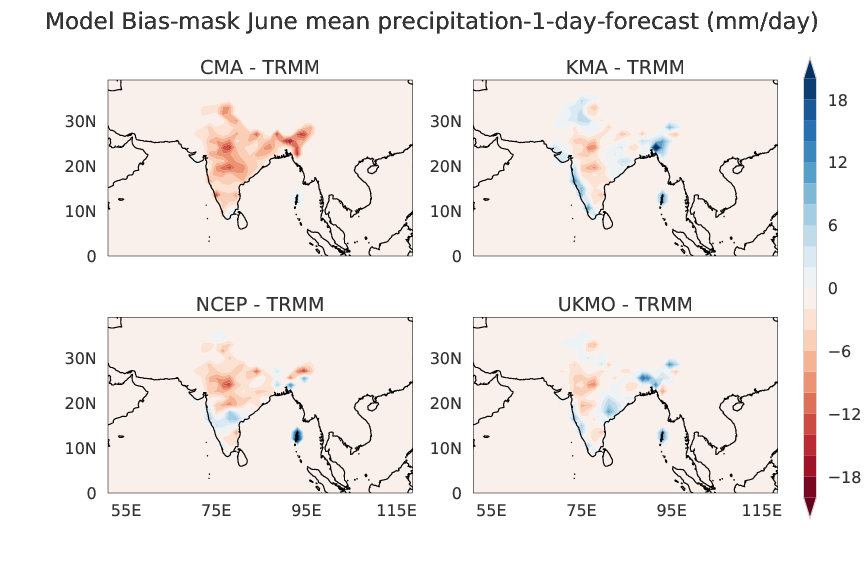

In [41]:
WImage(filename='Model_bias_1_day_mask_jun.pdf')

Inorder to verify forecasts it is always better to divide India into homogenous regions as models often bring out poor reults over certain parts of the country. As such the six homogenous regions suggested by IITM, Pune are considered separately for forecast verification. 

![img](ismreg.png)

#  # Due to unavailability of the shape files of these particular regions, I generated them using Google-Earth and QGIS which helped me achieve the same by converting the generated kml file into the corresponding shape file.


The figure below shows how a shape file for one of the aforementioned regions is generated. 

![img](g_e.png)

Similarly shape files were generated for the core-monsoon region of India shown next.

 ![img](coremonsoon.png)

The july mean precipitation from 1-day model forecasts for the core-monsoon region was then compared to observations. 

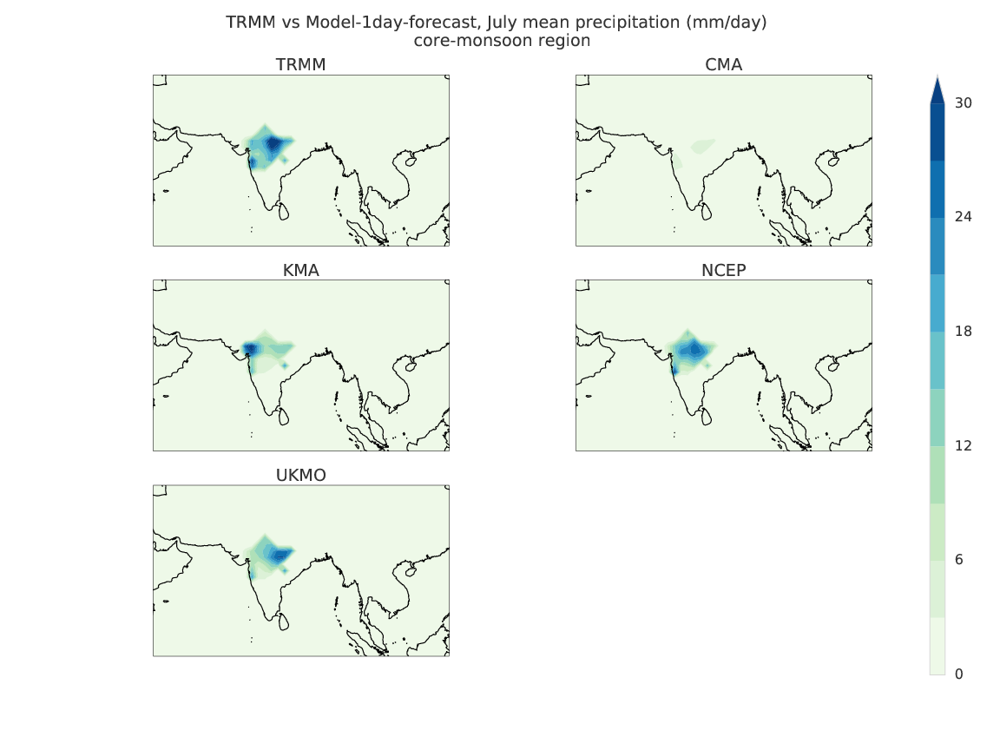

In [44]:
WImage(filename='TRMM_vs_1_day_core-monsoon_july.pdf')

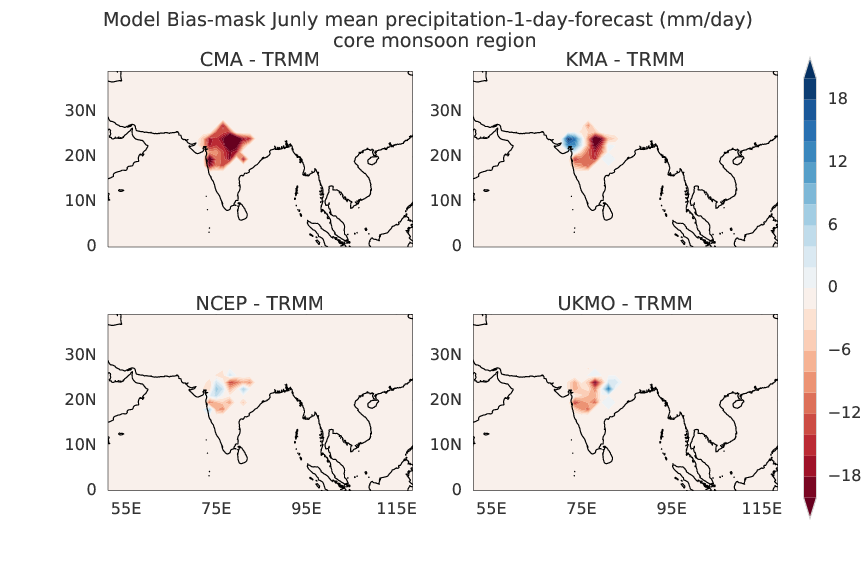

In [45]:
WImage(filename='Model_bias_1_day_mask_core_monsoon_july.pdf')

Both NCEP and UKMO very accurately produce the mean precipitation observed in TRMM data. CMA and KMA perform poorly. 

# Forecast Verfication 

Some basic quantitave forecast verification techniques have been implemented to check for accuracy and consistency. The Bias, Root Mean Squared Error (RMSE) and Pearson correlation coefficient has been computed along with the generated scatterd plots of observations versus forecasts. $\textbf{All calculations as of now have been done for 1 day forecast in July.}$

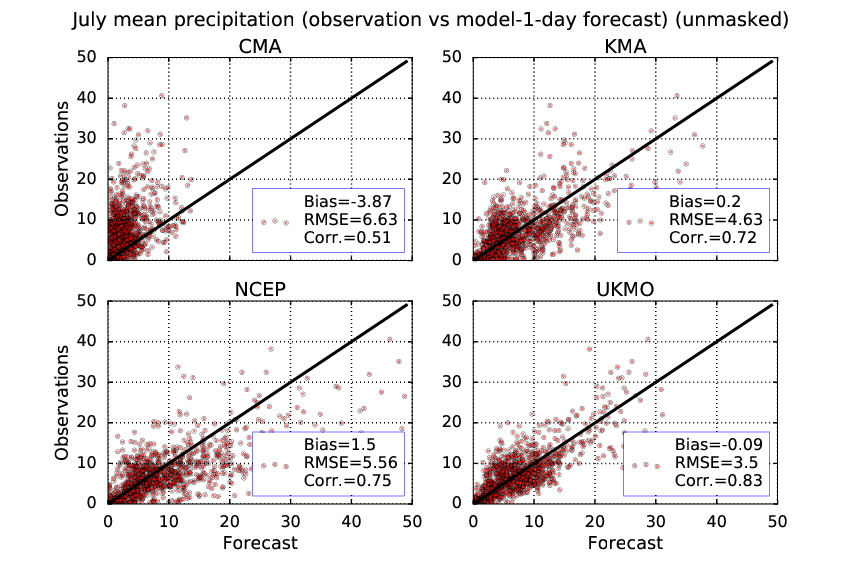

In [46]:
WImage(filename='Scatter_plot_july_mean_unmasked_india.pdf')

The above figure shows a scatter plot between observations and 1-day forecast for mean precipitation in July over the entire region (50-120E) and (0-40N). In a time-mean sense NCEP and UKMO strong correlations with observations with low RMSE. The situation further improves when the same calculations are repeated over Indian land only .  

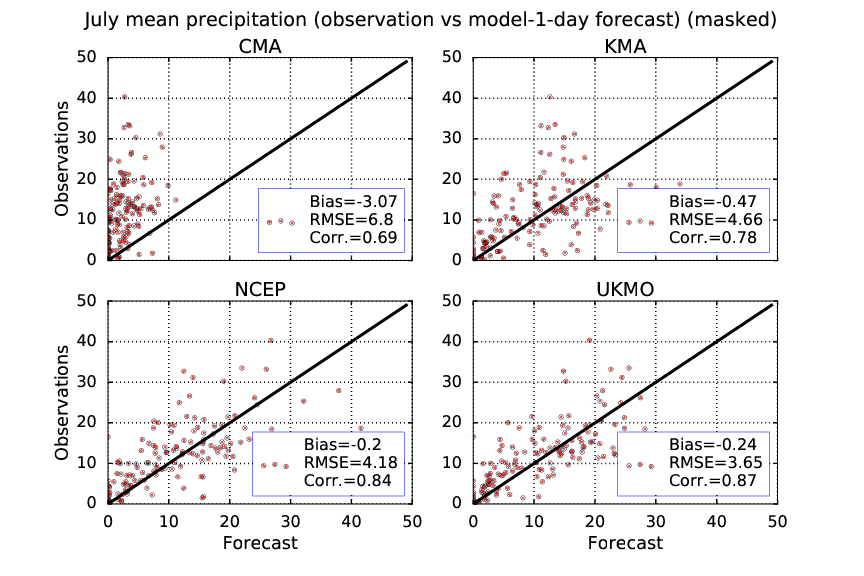

In [49]:
WImage(filename='Scatter_plot_july_mean_masked_india.pdf')

However the entire picture changes when daily events over the entire region is considered. All models start showing a very poor correlation and large RMSE. The reason may be because of land-sea contrast and the model inefficiencies to simulate precipitations correctly over the oceans. When the Indian land is considered, the correlation increases two times incase of NCEP and UKMO with very slight reduction in RMSE.   

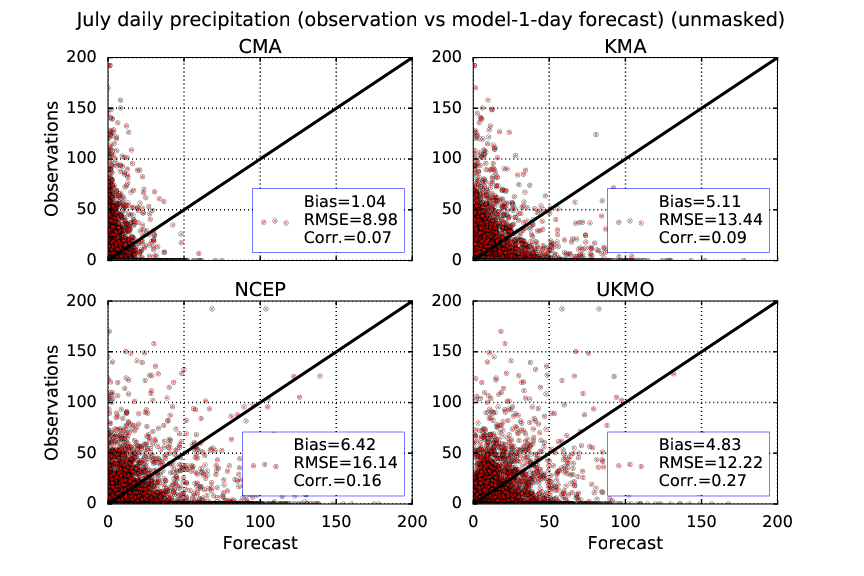

In [51]:
WImage(filename='Scatter_plot_july_daily_unmasked_india.pdf')

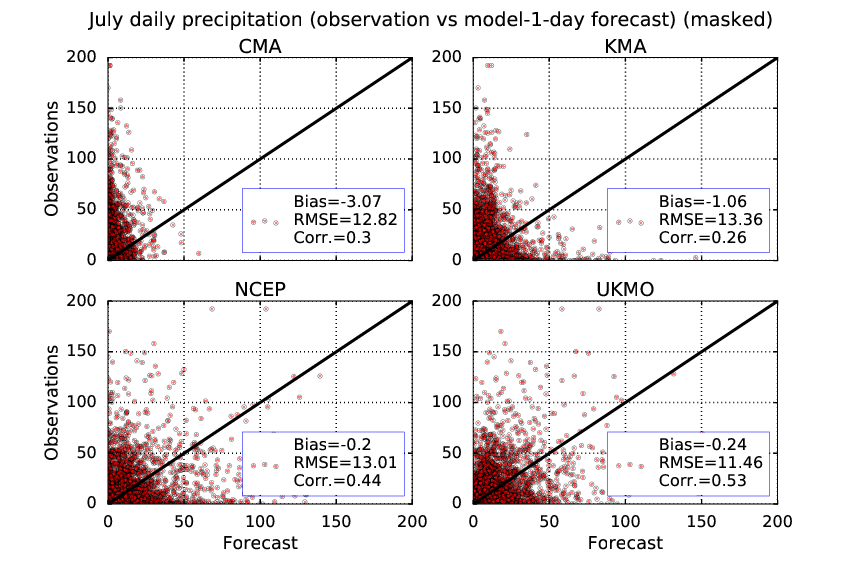

In [50]:
WImage(filename='Scatter_plot_july_daily_masked_india.pdf')

When the core Indian monsoon region is considered for daily precipitation, UKMO shows fairly good correlation over the core monsoon regions while all other models fail. 

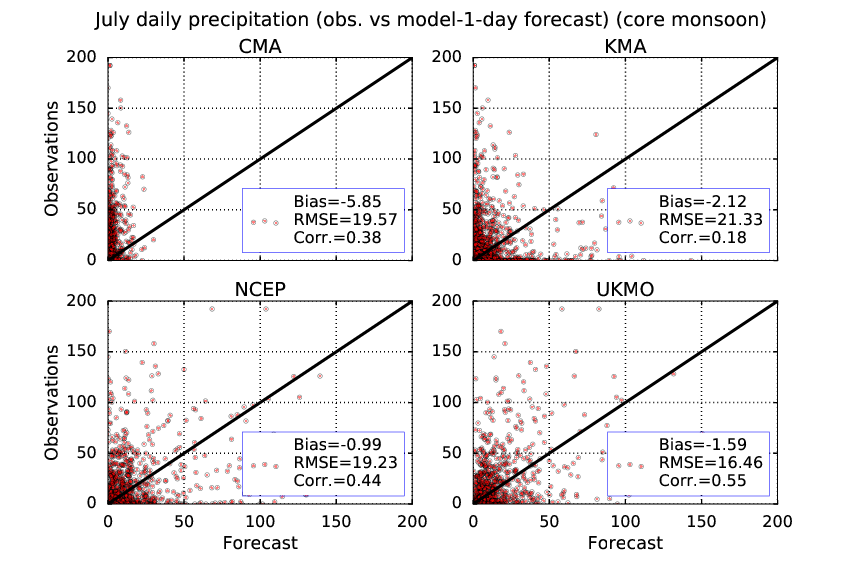

In [52]:
WImage(filename='Scatter_plot_july_daily_masked_core_monsoon.pdf')

Similar results are required to be generated for the homogenous regions of India for JJAS with 1,3,5,9 day forecasts. Other skill scores are also required to be implemented. 